# Linear Algebra in Pattern Recognition

(Author: Jaiprakash R)

## Handwritten Digit Recognition using K-Means Algorithm

In this section, we demonstrate the K-Means algorithm for clustering. As mentioned in class, we would realize that the failure to account for variation within the clusters results in poor testing error.

*Note:* We use the data without any kind of pre-processing like normalization, feature extraction etc...

In [146]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from statistics import mode

In [3]:
tr = pd.read_csv("F:\JP\TA\Foundations of ML and AI\Linear Algebra\Week 2\Handwriten Digits Recognition\mnist_train.csv",header=None,engine='python')
tst = pd.read_csv("F:\JP\TA\Foundations of ML and AI\Linear Algebra\Week 2\Handwriten Digits Recognition\mnist_test.csv",header=None,engine='python')
tr = np.matrix(tr)
tst = np.matrix(tst)

# To read about the dataset, please visit http://yann.lecun.com/exdb/mnist/

In [4]:
tr_labels = tr.transpose()[0]
tr = tr.transpose()[1:].transpose()
tst_labels = tst.transpose()[0]
tst = tst.transpose()[1:].transpose()

The training dataset 'tr' consists of 60000 points, and the testing set 'tst' consists of 10000 points. The sets tr_labels and tst_labels consist of the labels for training and test points respectively.

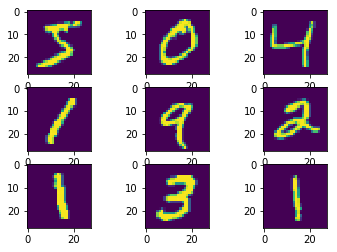

In [147]:
#visualizing the first 9 training points

fig = plt.figure()

for i in range(9):
    ax = fig.add_subplot(3,3,i+1)
    ax.imshow(tr[i].reshape(28,28))

In [148]:
class kmeans:
    
    """This class allows you to classify the MNIST data points using K-Means."""
    
    def __init__(self,ntrain,ntest,tr,tst,tr_labels,tst_labels):
        
        self.ntrain = ntrain             #number of training points
        self.ntest = ntest               #number of testing points
        self.tr = tr
        self.tst = tst
        self.tr_labels = tr_labels
        self.tst_labels = tst_labels
        self.train_clusters = []
        self.test_clusters = []
        self.labels = [0]*10
        
    def build_clusters(self,clusters,predicted_labels,data, training = 1):
        
        indices = []
        
        for i in range(10):
            clusters.append([])
            indices.append([])

        for j in range(len(data)):
            clusters[predicted_labels[j]].append(data[j])
            if training == 1:
                indices[predicted_labels[j]].append(list(np.array(self.tr_labels[0])[0])[j])
            else:
                indices[predicted_labels[j]].append(list(np.array(self.tst_labels[0])[0])[j])
        
        for i in range(10):
            self.labels[i] = mode(indices[i])
    
        
    def fit(self):
        """This method plots the cluster means and prints the training error and testing error."""
        
        self.train = self.tr[:self.ntrain]
        model = KMeans(n_clusters = 10,init='k-means++')
        model.fit(self.train)
        means = model.cluster_centers_
        fig = plt.figure()

        for i in range(10):
            ax = fig.add_subplot(2,5,i+1)
            ax.imshow(means[i].reshape(28,28))
            
        cluster_assignments = model.predict(self.train)
        
        kmeans.build_clusters(self,self.train_clusters,cluster_assignments,self.train)
            
        count = 0
        for i in range(self.ntrain):
            if self.labels[cluster_assignments [i]] == np.array(self.tr_labels)[0][i]:
                count += 1
            
        self.training_error = 1 - (count/self.ntrain)
        print("Training error = {}.".format(self.training_error))
        
        kmeans.predict(self,model)
    
    
    def predict(self,model):
        
        self.test = self.tst[:self.ntest]
        cluster_assignments= model.predict(self.test)
        
        kmeans.build_clusters(self,self.test_clusters,cluster_assignments,self.test,training=0)
        
        count = 0
        for i in range(self.ntest):
            if self.labels[cluster_assignments [i]] == np.array(self.tst_labels)[0][i]:
                count += 1
            
        self.testing_error = 1 - (count/self.ntest)
        print("Testing error = {}.".format(self.testing_error))
        
        
        
        
        
 

*Note that the K-Means algorithm toolbox outputs the clusters in a random order i.e. the $i^{th}$* cluster need not correspond to label $i$.*

Training error = 0.40926666666666667.
Testing error = 0.40549999999999997.


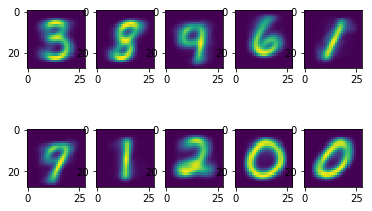

In [149]:
model = kmeans(60000,10000,tr,tst,tr_labels,tst_labels) #We use the training and test sets in their entirety.
model.fit()

**Note that the mis-classification proportion is high in both the training and test sets.**

In [150]:
model.labels #the labels corresponding to each cluster in the order given by the algorithm.

[3, 8, 4, 6, 1, 7, 1, 2, 0, 0]

*Note that some labels are not even assigned by K-Means algorithm when the data is used without any pre-processing.*

In [151]:
lens = []
for i in range(10):
    lens.append(len(model.test_clusters[i]))
lens # number of points in each clusters

[1315, 1097, 1549, 927, 849, 1428, 995, 800, 492, 548]

Now, we visualize the images in each clusters from the test set and realize the poor performance of the algorithm.

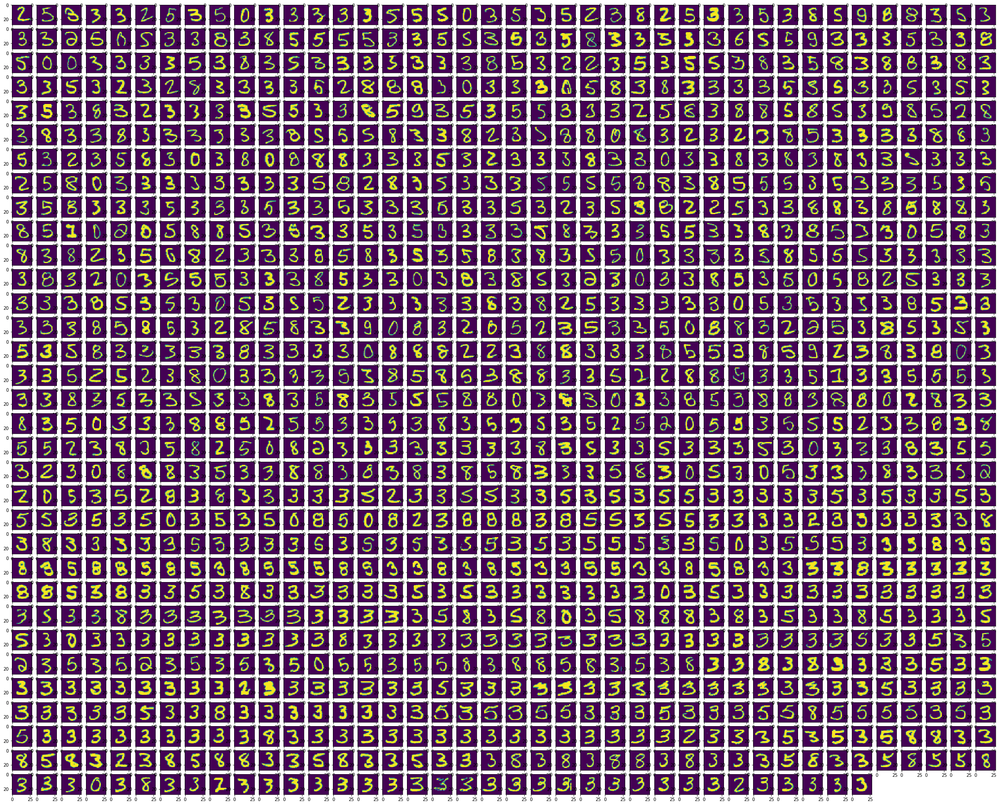

In [152]:
#cluster 1
fig = plt.figure(figsize=(40,40))

for i in range(len(model.test_clusters[0])):

    ax = fig.add_subplot(40,40,i+1)
    ax.imshow(model.test_clusters[0][i].reshape(28,28))

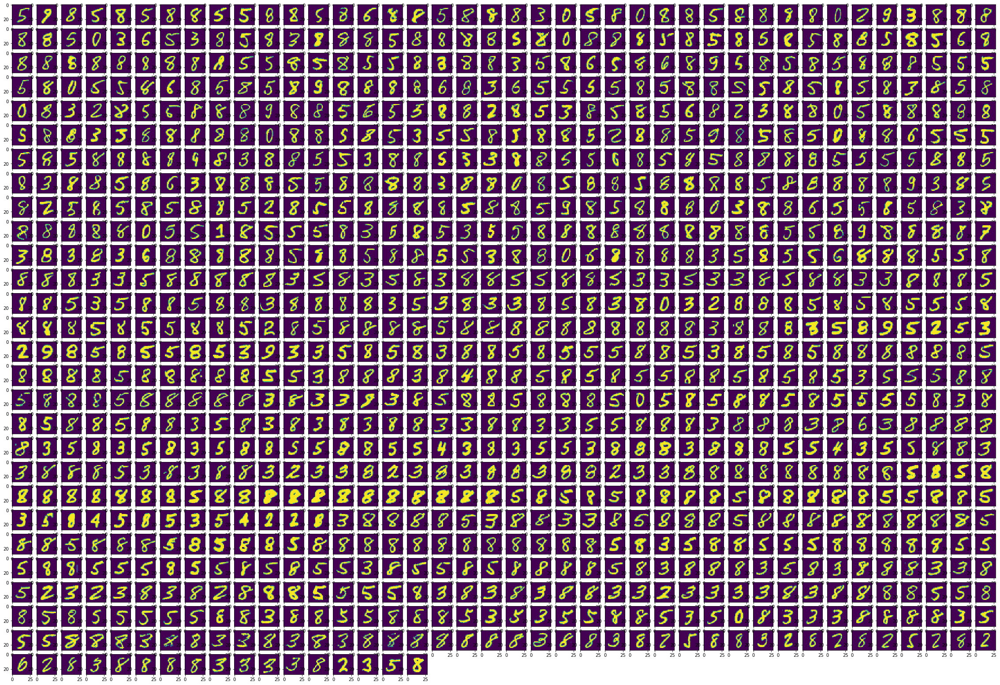

In [153]:
#cluster 2
fig = plt.figure(figsize=(40,40))

for i in range(len(model.test_clusters[1])):

    ax = fig.add_subplot(40,40,i+1)
    ax.imshow(model.test_clusters[1][i].reshape(28,28))

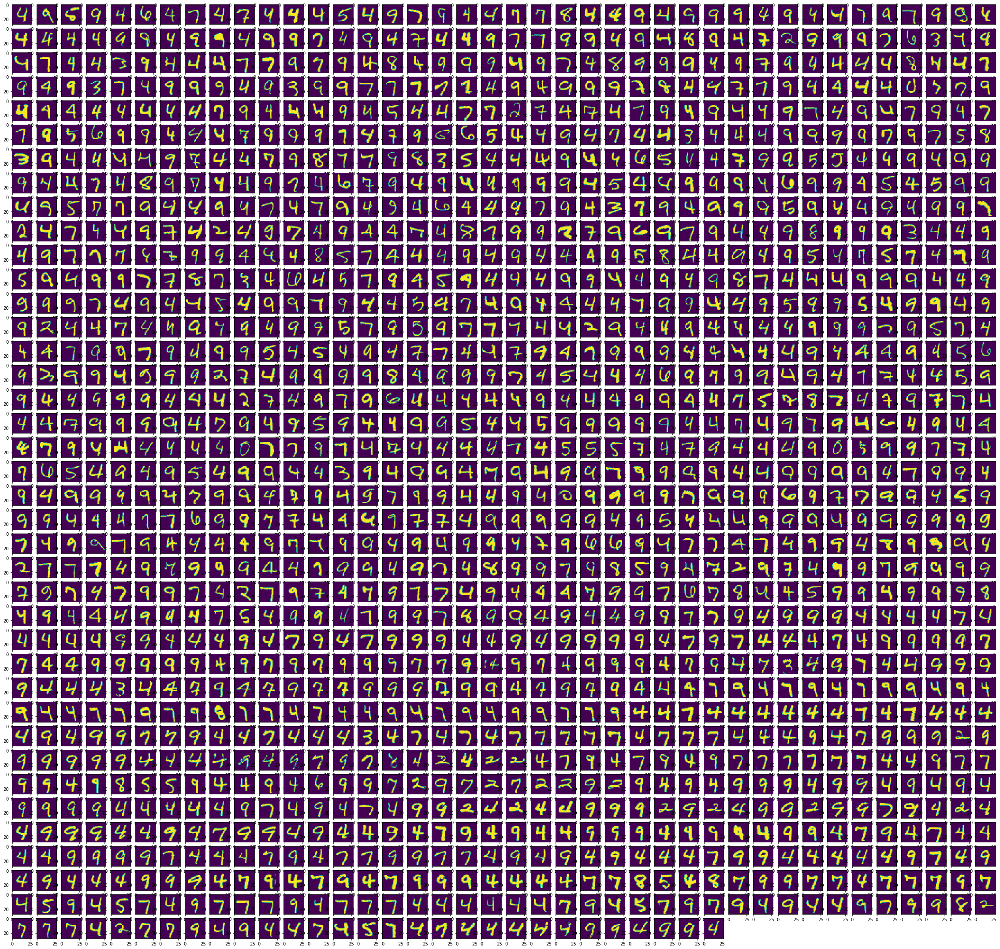

In [155]:
#cluster 3
fig = plt.figure(figsize=(40,40))

for i in range(len(model.test_clusters[2])):

    ax = fig.add_subplot(40,40,i+1)
    ax.imshow(model.test_clusters[2][i].reshape(28,28))

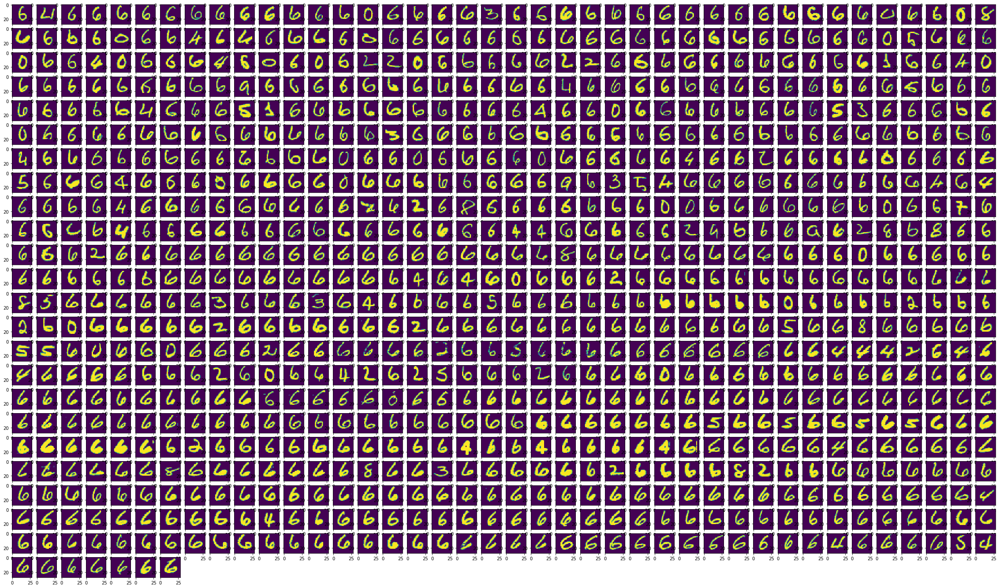

In [156]:
#cluster 4
fig = plt.figure(figsize=(40,40))

for i in range(len(model.test_clusters[3])):

    ax = fig.add_subplot(40,40,i+1)
    ax.imshow(model.test_clusters[3][i].reshape(28,28))

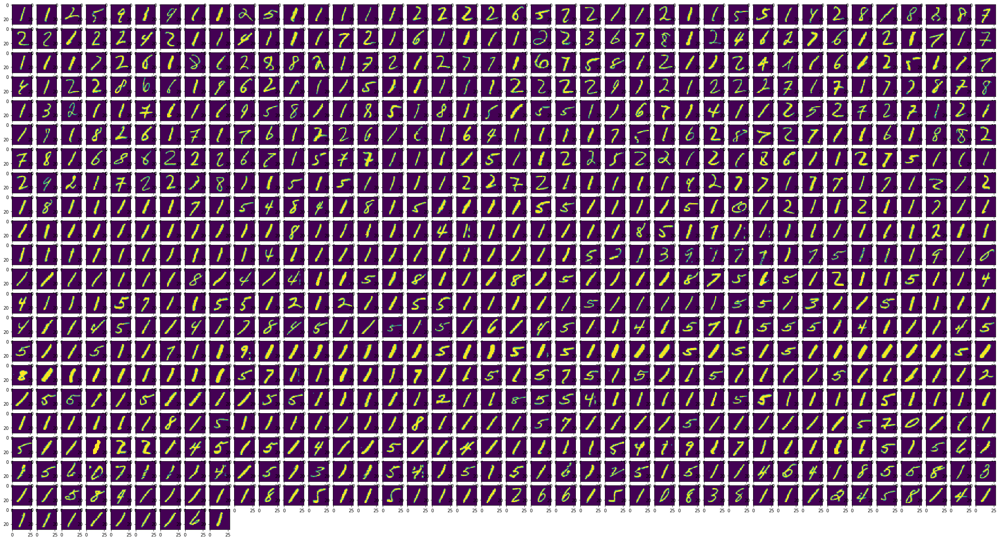

In [157]:
#cluster 5 
fig = plt.figure(figsize=(40,40))

for i in range(len(model.test_clusters[4])):

    ax = fig.add_subplot(40,40,i+1)
    ax.imshow(model.test_clusters[4][i].reshape(28,28))

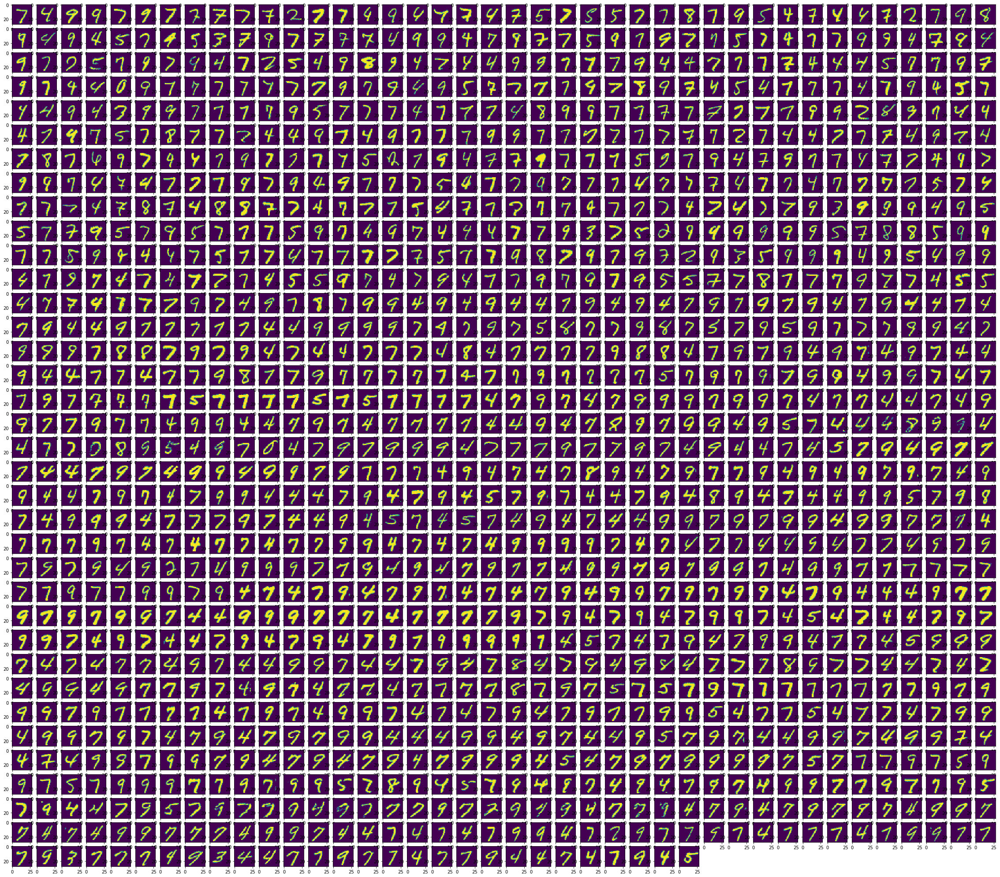

In [158]:
#cluster 6
fig = plt.figure(figsize=(40,40))

for i in range(len(model.test_clusters[5])):

    ax = fig.add_subplot(40,40,i+1)
    ax.imshow(model.test_clusters[5][i].reshape(28,28))

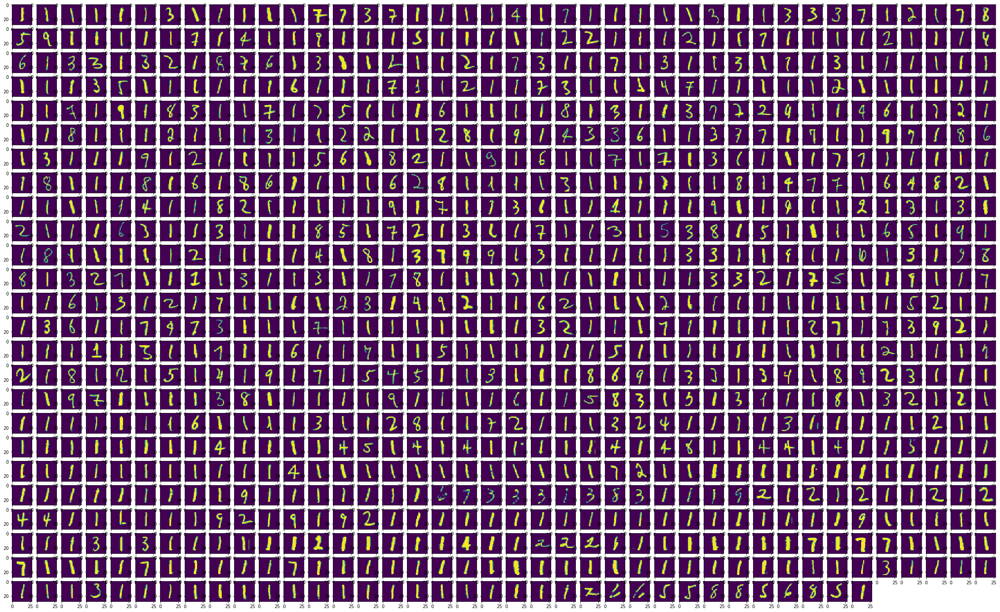

In [159]:
#cluster 7
fig = plt.figure(figsize=(40,40))

for i in range(len(model.test_clusters[6])):

    ax = fig.add_subplot(40,40,i+1)
    ax.imshow(model.test_clusters[6][i].reshape(28,28))

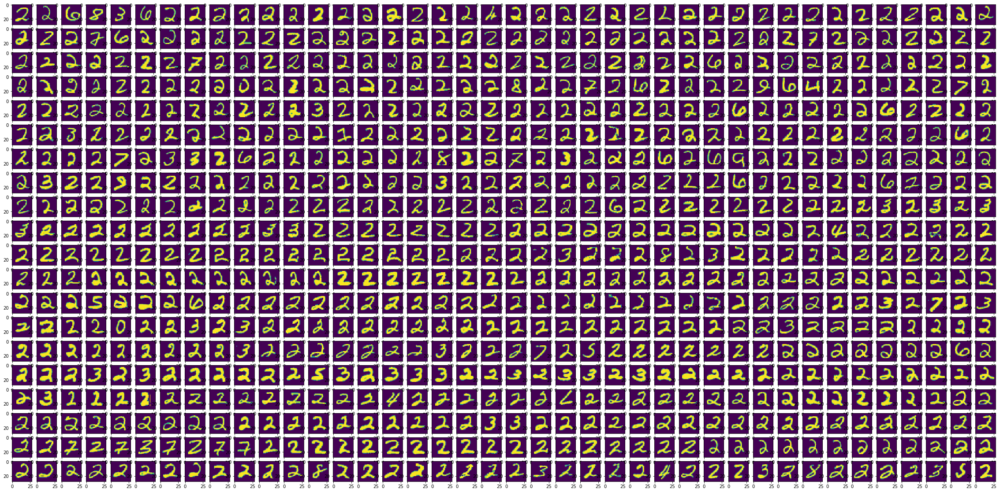

In [160]:
#cluster 8
fig = plt.figure(figsize=(40,40))

for i in range(len(model.test_clusters[7])):

    ax = fig.add_subplot(40,40,i+1)
    ax.imshow(model.test_clusters[7][i].reshape(28,28))

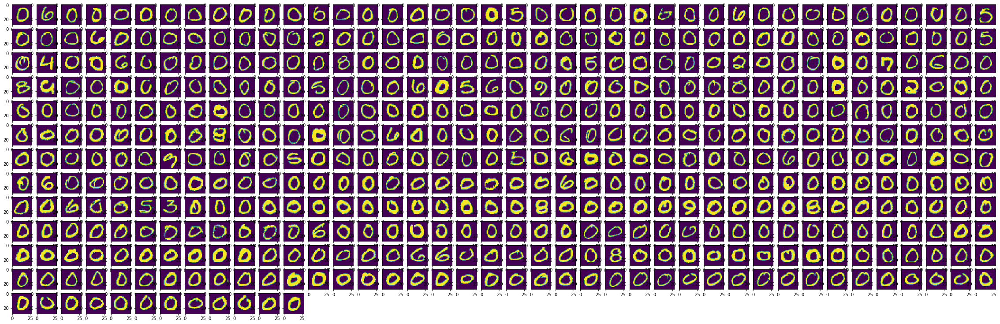

In [161]:
#cluster 9
fig = plt.figure(figsize=(40,40))

for i in range(len(model.test_clusters[8])):

    ax = fig.add_subplot(40,40,i+1)
    ax.imshow(model.test_clusters[8][i].reshape(28,28))

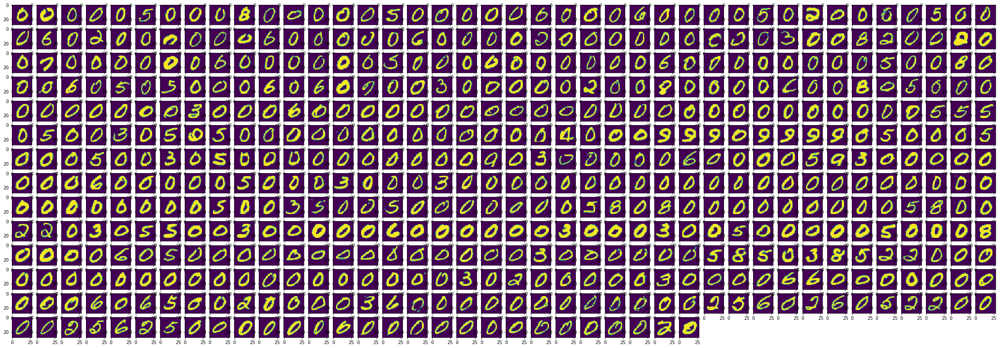

In [162]:
#cluster 10
fig = plt.figure(figsize=(40,40))

for i in range(len(model.test_clusters[9])):

    ax = fig.add_subplot(40,40,i+1)
    ax.imshow(model.test_clusters[9][i].reshape(28,28))

## Handwritten Digit Recognition using the SVD Algorithm


In this section, we demonstrate that SVD can be used to reduced the classification error significantly.

We construct ten matrices corresponding to 
different labels in the training set and perform SVD on each of them.

*Note:* The code is written assuming that we use the whole training set.

In [163]:
A1,A2,A3,A4,A5,A6,A7,A8,A9,A0 = [],[],[],[],[],[],[],[],[],[]

for i in range(len(np.array(tr_labels)[0])):
    if np.array(tr_labels)[0][i] == 1:
        A1.append(np.array(tr[i])[0])
    if np.array(tr_labels)[0][i] == 2:
        A2.append(np.array(tr[i])[0])
    if np.array(tr_labels)[0][i] == 3:
        A3.append(np.array(tr[i])[0])
    if np.array(tr_labels)[0][i] == 4:
        A4.append(np.array(tr[i])[0])
    if np.array(tr_labels)[0][i] == 5:
        A5.append(np.array(tr[i])[0])
    if np.array(tr_labels)[0][i] == 6:
        A6.append(np.array(tr[i])[0])
    if np.array(tr_labels)[0][i] == 7:
        A7.append(np.array(tr[i])[0])
    if np.array(tr_labels)[0][i] == 8:
        A8.append(np.array(tr[i])[0])
    if np.array(tr_labels)[0][i] == 9:
        A9.append(np.array(tr[i])[0])
    if np.array(tr_labels)[0][i] == 0:
        A0.append(np.array(tr[i])[0])

In [164]:
#Note that each image is stored as a row in the above matrices. Therefore, our singular vectors are columns of the 
#matrix V in this case, as opposed to U as mentioned in class.

#Computing singular vectors for each of the 'image spaces'
U1 = np.linalg.svd(A1)[2]
U2 = np.linalg.svd(A2)[2]
U3 = np.linalg.svd(A3)[2]
U4 = np.linalg.svd(A4)[2]
U5 = np.linalg.svd(A5)[2]
U6 = np.linalg.svd(A6)[2]
U7 = np.linalg.svd(A7)[2]
U8 = np.linalg.svd(A8)[2]
U9 = np.linalg.svd(A9)[2]
U0 = np.linalg.svd(A0)[2]

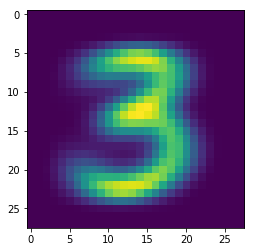

In [165]:
#the first singular image from the 'ímage space of 3s'
plt.imshow(U3[0].reshape(28,28))


In [166]:
k = 10 #number of singular values considered
U1_hat = U1[0:k]
U2_hat = U2[0:k]
U3_hat = U3[0:k]
U4_hat = U4[0:k]
U5_hat = U5[0:k]
U6_hat = U6[0:k]
U7_hat = U7[0:k]
U8_hat = U8[0:k]
U9_hat = U9[0:k]
U0_hat = U0[0:k]

In [167]:
I = np.identity(784)
U = [U0_hat,U1_hat,U2_hat,U3_hat,U4_hat,U5_hat,U6_hat,U7_hat,U8_hat,U9_hat]

def residualnorm(vec, sing_vec):
    
    W = I - np.dot(np.transpose(sing_vec),sing_vec)
    
    return np.linalg.norm(np.dot(W,vec),ord=2)


def predict(vec):
    """This function predicts the cluster label for each test point based on the minimum residual vector principle."""
    norms = [0]*10
    for i in range(10):
        norms[i] = residualnorm(vec,U[i])
    
    return norms.index(np.min(norms))
        
    

In [168]:
def test(ntest):
    
    count = 0
    for i in range(ntest):
        kk = predict(np.array(tst[i])[0])
        clusters[kk].append(np.array(tst[i])[0])
        if kk == np.array(tst_labels)[0][i]:
            count += 1
            
    testing_error = 1 - (count/ntest)
    print("Testing error = {}.".format(testing_error))
        
        

In [169]:
clusters = []
        
for i in range(10):
    clusters.append([])

test(ntest=10000) #number of test points

Testing error = 0.05149999999999999.


**See that the testing error in this case is about 5% as opposed to 40% in the case of K-means.**

In [170]:
lens = []
for i in range(10):
    lens.append(len(clusters[i]))
lens # number of points in each clusters

[1018, 1180, 998, 1016, 984, 867, 958, 1001, 965, 1013]

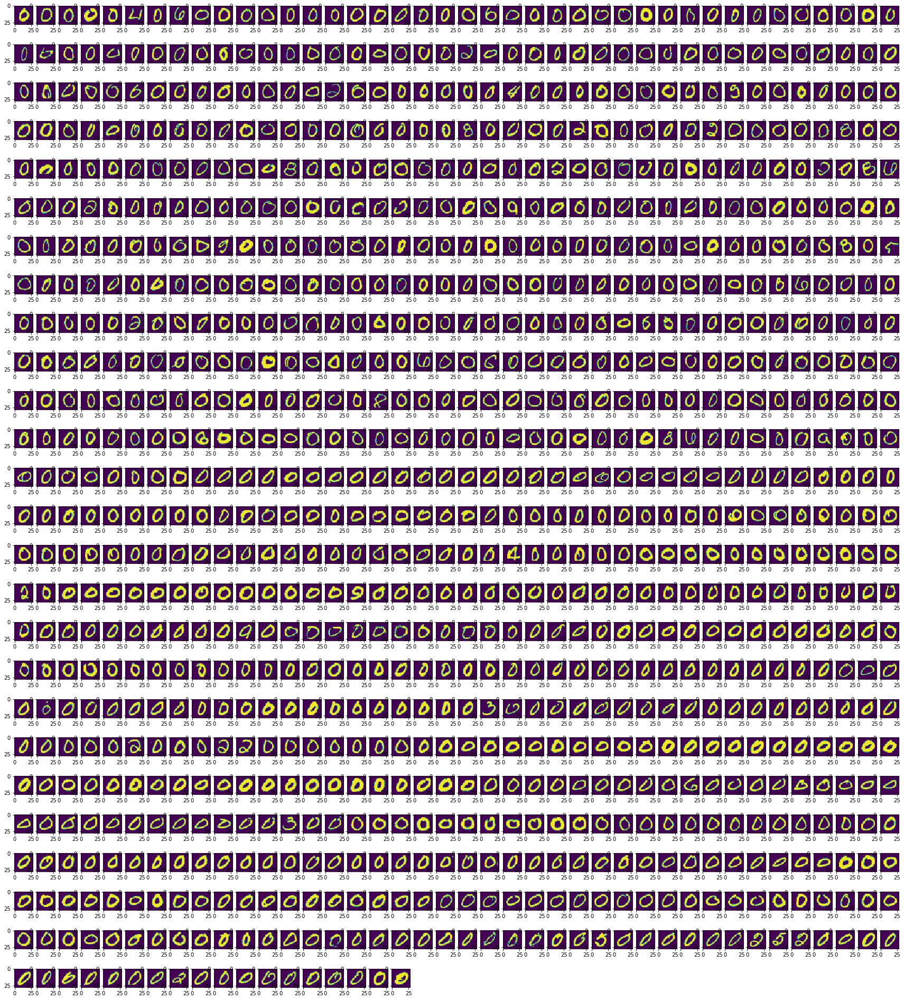

In [171]:
#cluster 1
fig = plt.figure(figsize=(30,40))

for i in range(len(clusters[0])):

    ax = fig.add_subplot(30,40,i+1)
    ax.imshow(clusters[0][i].reshape(28,28))

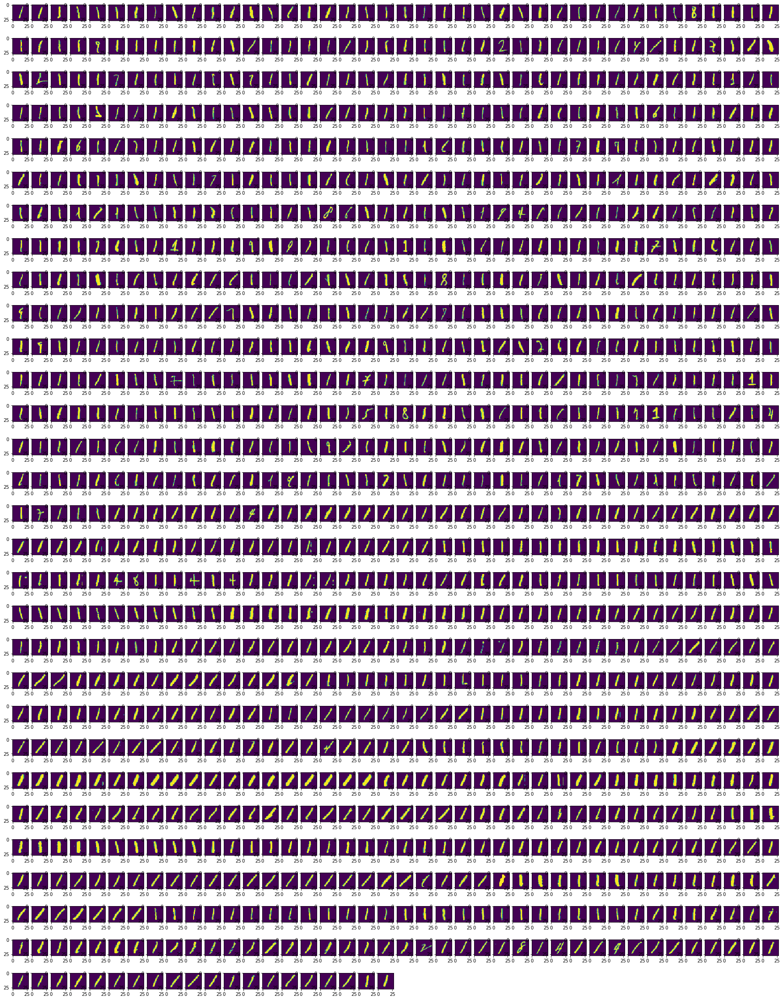

In [172]:
#cluster 2
fig = plt.figure(figsize=(30,40))

for i in range(len(clusters[1])):

    ax = fig.add_subplot(30,40,i+1)
    ax.imshow(clusters[1][i].reshape(28,28))

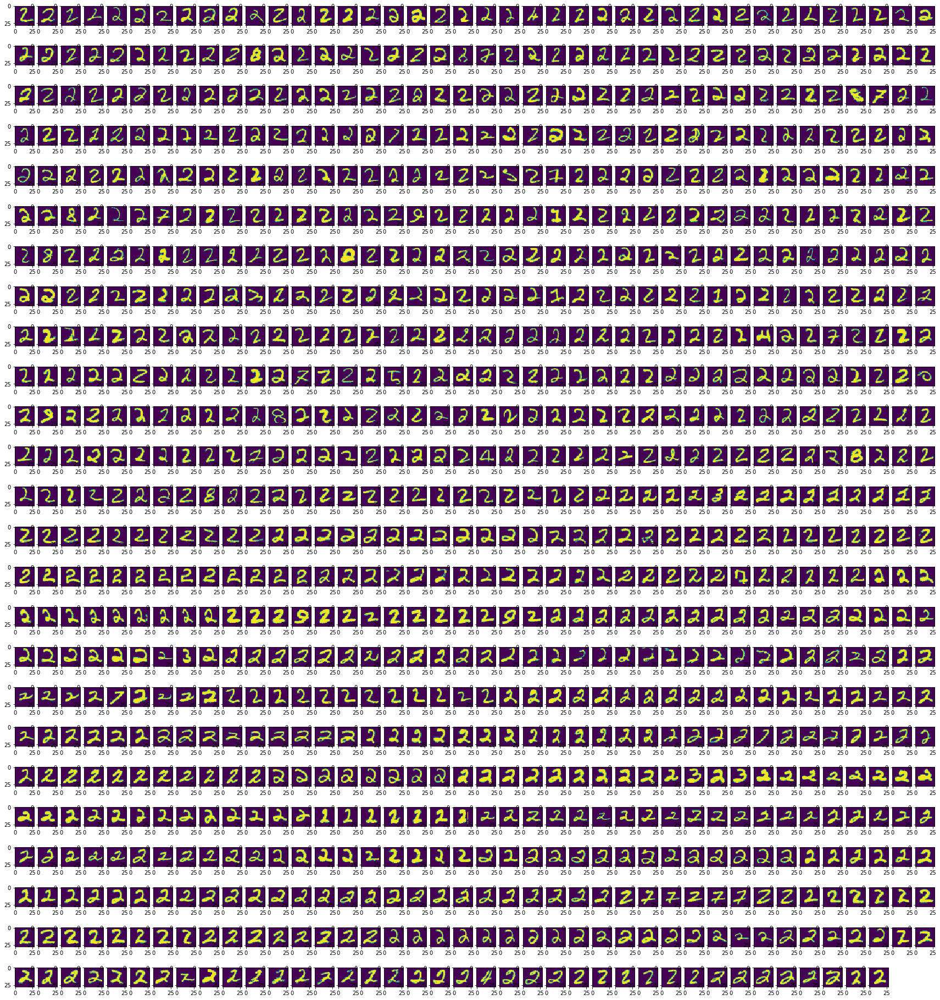

In [173]:
#cluster 3
fig = plt.figure(figsize=(30,40))

for i in range(len(clusters[2])):

    ax = fig.add_subplot(30,40,i+1)
    ax.imshow(clusters[2][i].reshape(28,28))

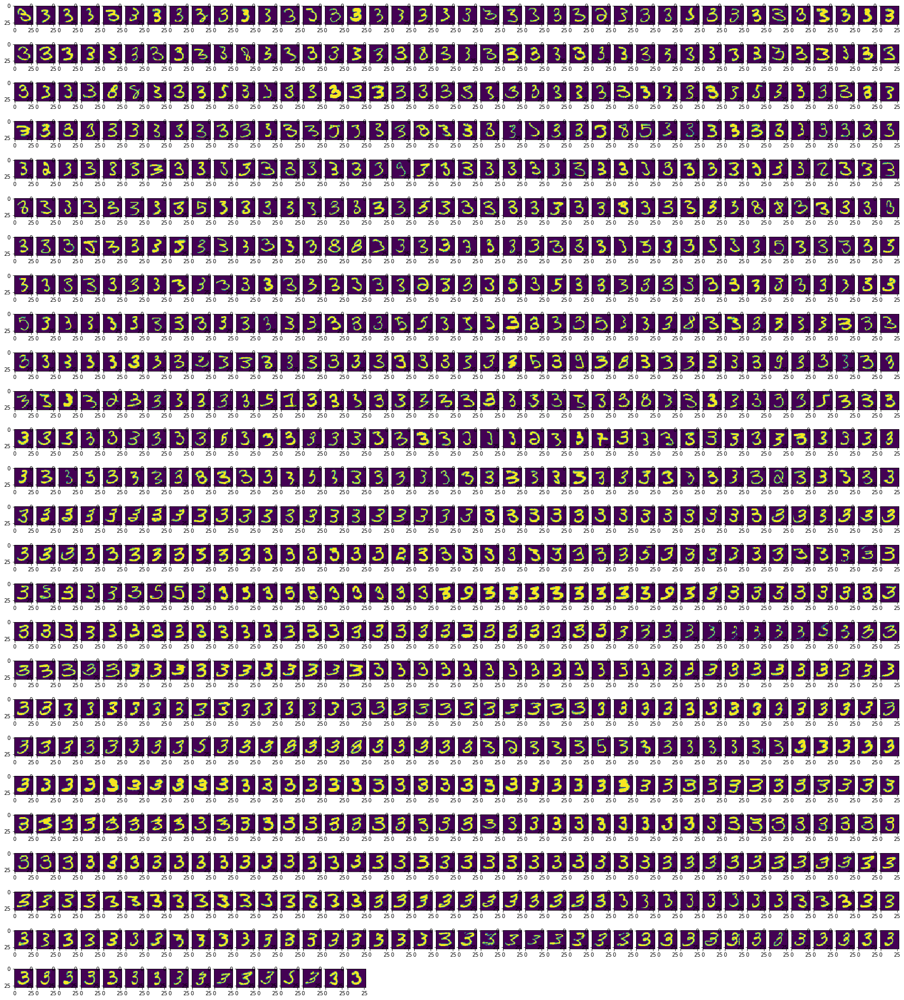

In [174]:
#cluster 4
fig = plt.figure(figsize=(30,40))

for i in range(len(clusters[3])):

    ax = fig.add_subplot(30,40,i+1)
    ax.imshow(clusters[3][i].reshape(28,28))

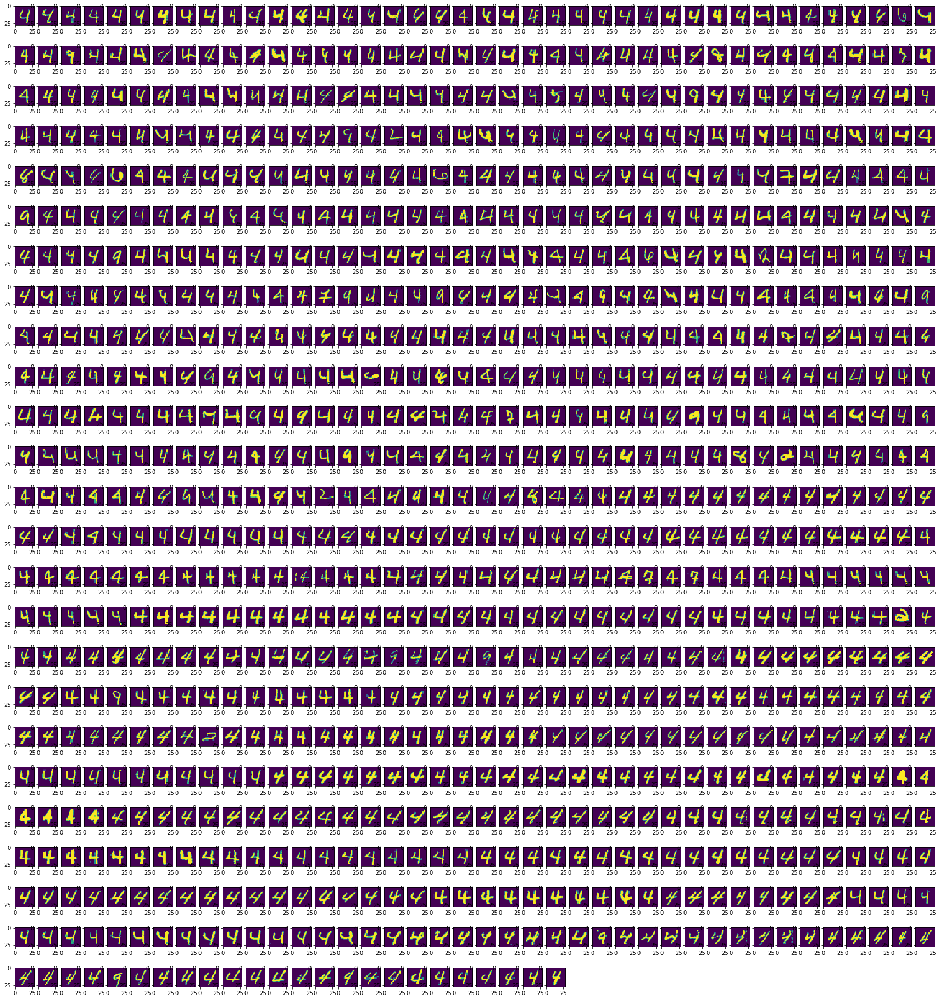

In [175]:
#cluster 5
fig = plt.figure(figsize=(30,40))

for i in range(len(clusters[4])):

    ax = fig.add_subplot(30,40,i+1)
    ax.imshow(clusters[4][i].reshape(28,28))

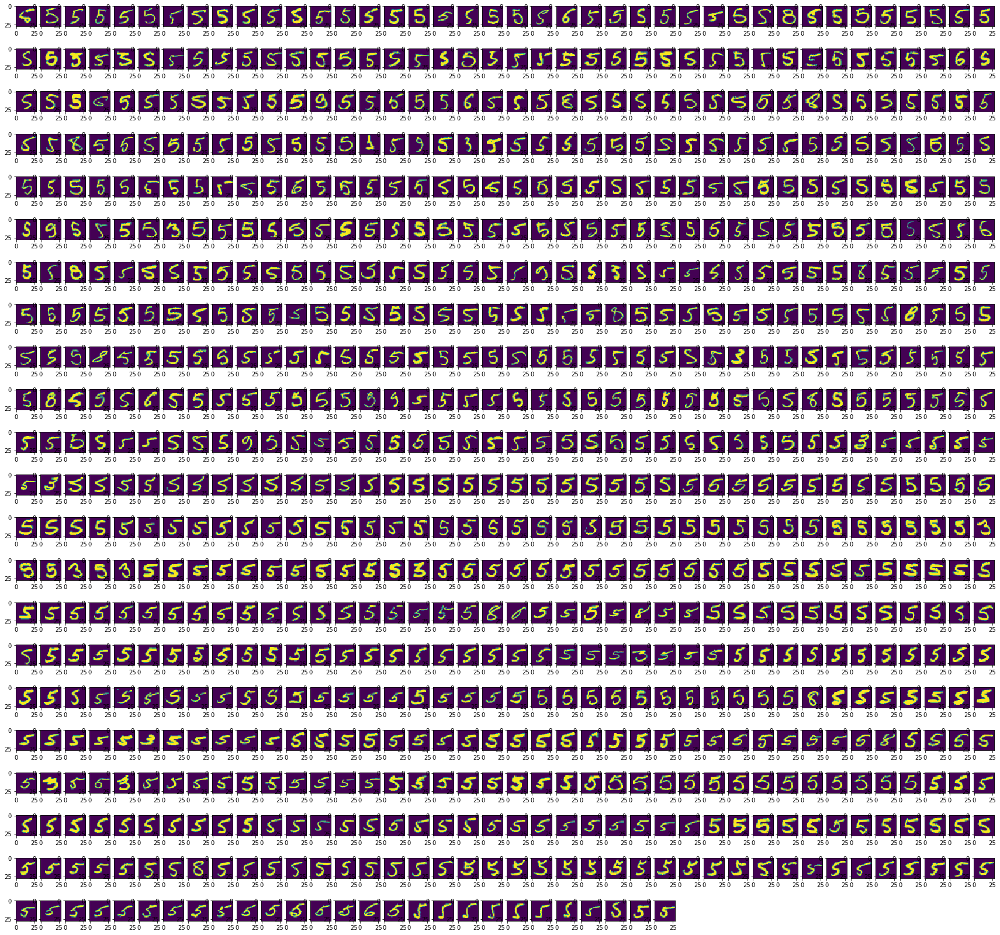

In [176]:
#cluster 6
fig = plt.figure(figsize=(30,40))

for i in range(len(clusters[5])):

    ax = fig.add_subplot(30,40,i+1)
    ax.imshow(clusters[5][i].reshape(28,28))

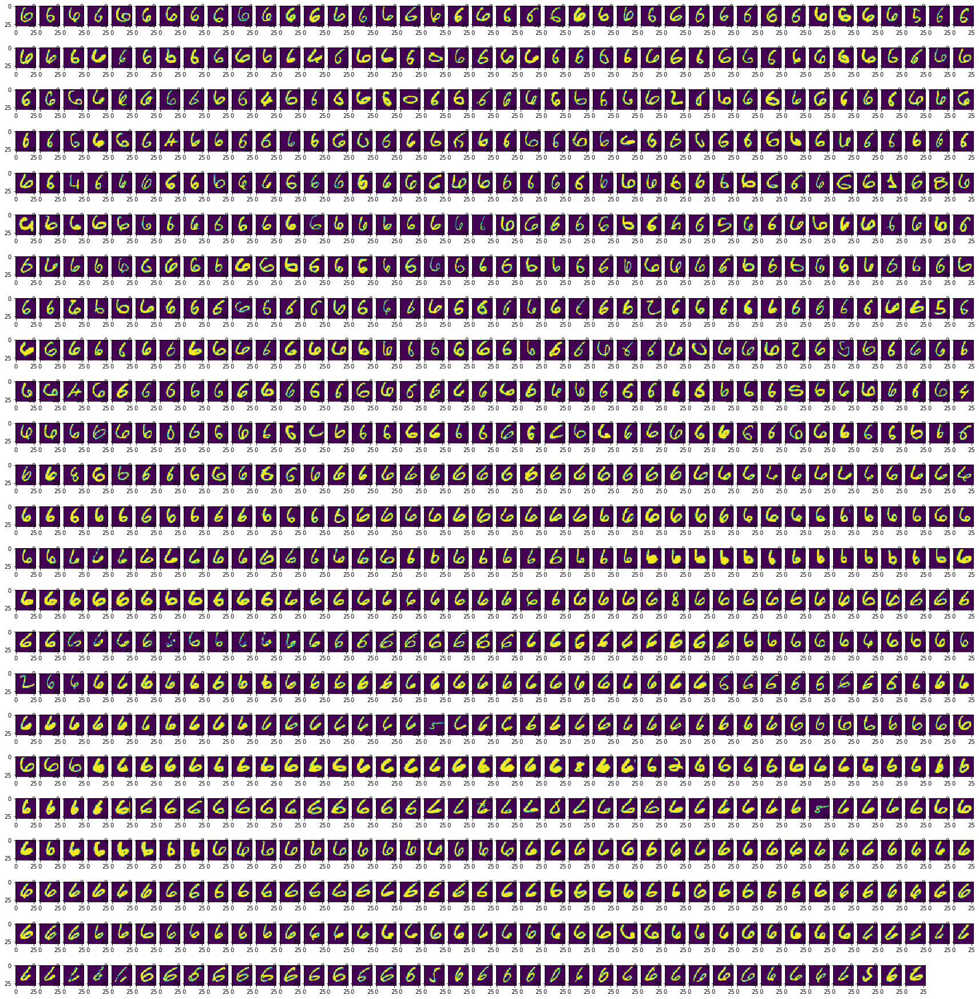

In [177]:
#cluster 7
fig = plt.figure(figsize=(30,40))

for i in range(len(clusters[6])):

    ax = fig.add_subplot(30,40,i+1)
    ax.imshow(clusters[6][i].reshape(28,28))

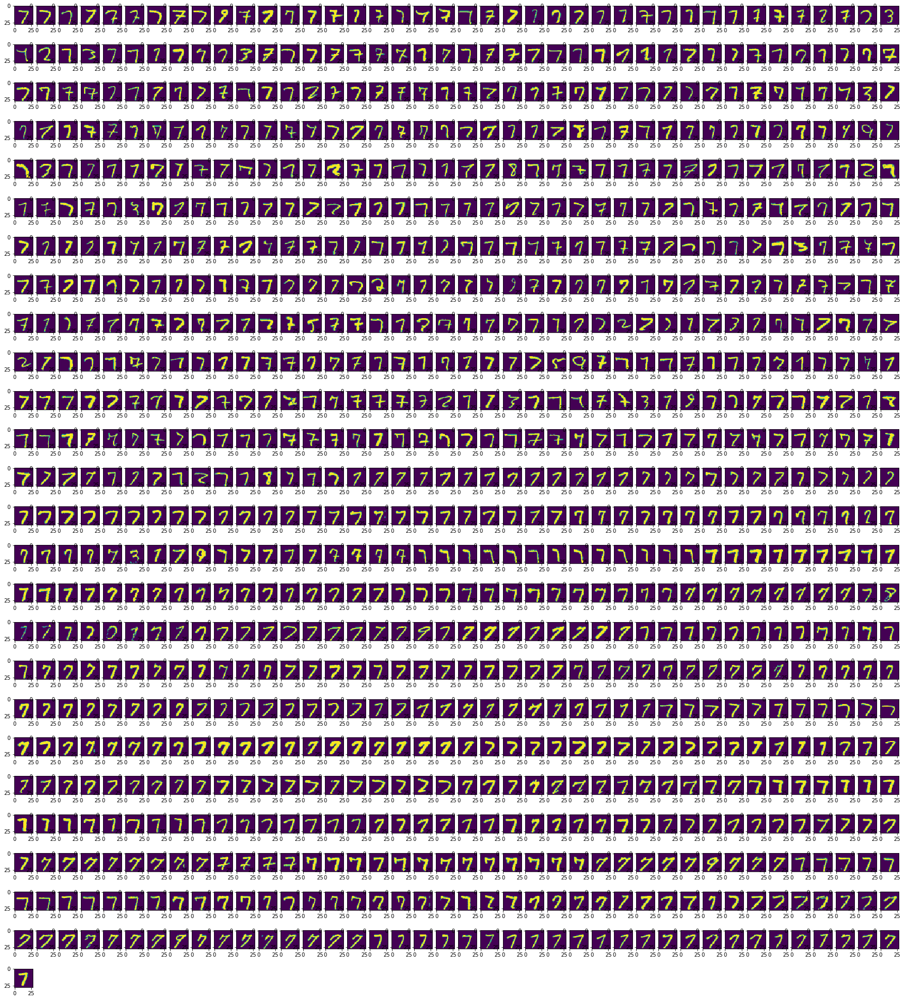

In [178]:
#cluster 8
fig = plt.figure(figsize=(30,40))

for i in range(len(clusters[7])):

    ax = fig.add_subplot(30,40,i+1)
    ax.imshow(clusters[7][i].reshape(28,28))

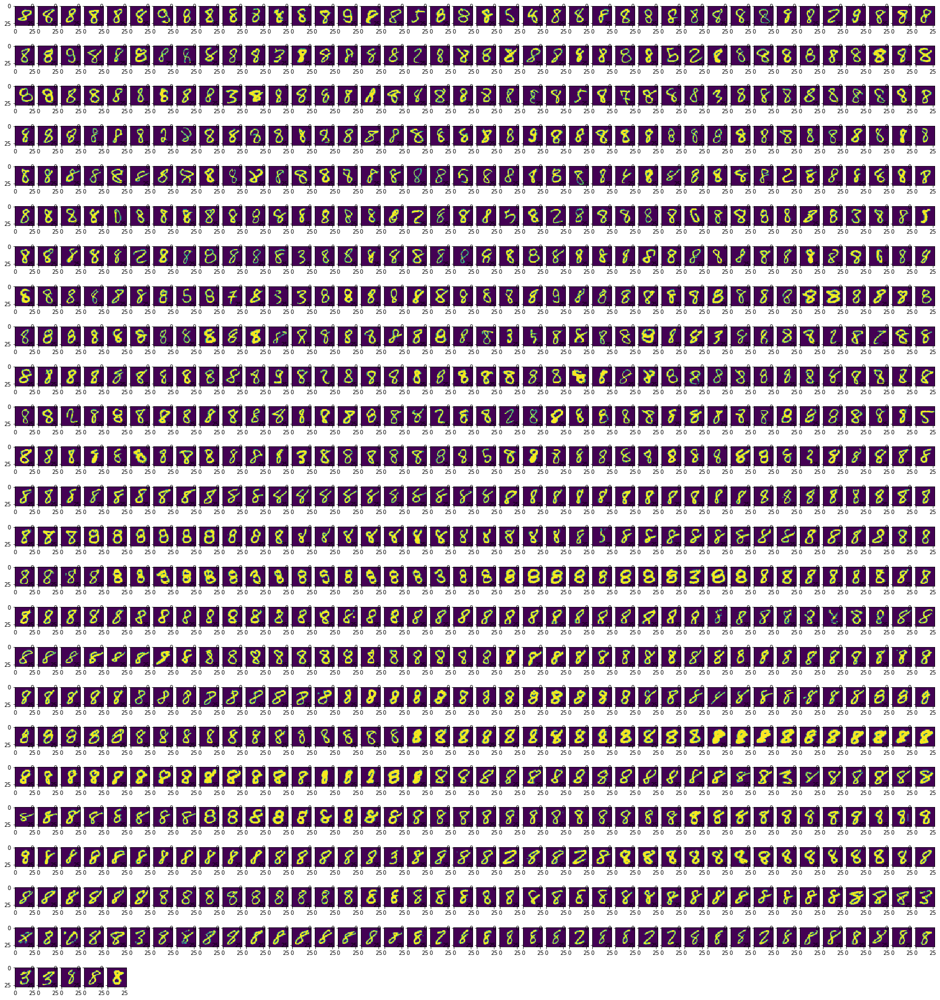

In [179]:
#cluster 9
fig = plt.figure(figsize=(30,40))

for i in range(len(clusters[8])):

    ax = fig.add_subplot(30,40,i+1)
    ax.imshow(clusters[8][i].reshape(28,28))

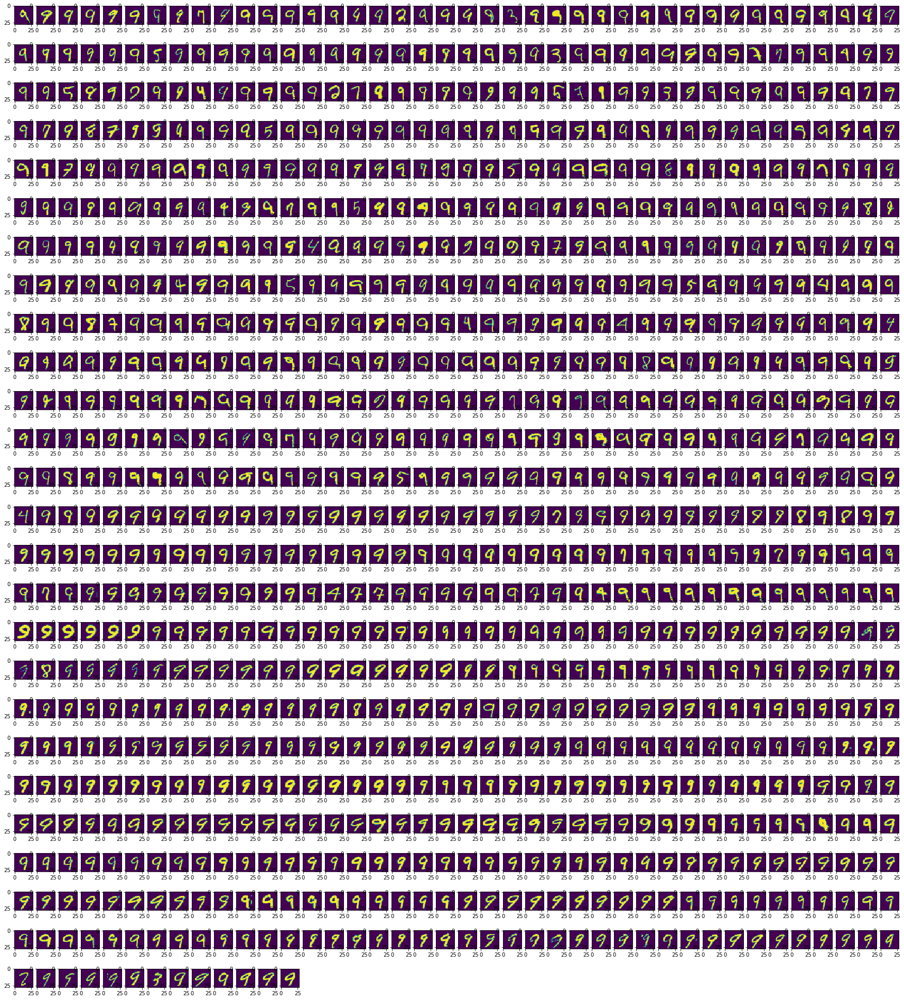

In [180]:
#cluster 10
fig = plt.figure(figsize=(30,40))

for i in range(len(clusters[9])):

    ax = fig.add_subplot(30,40,i+1)
    ax.imshow(clusters[9][i].reshape(28,28))

Thus, a key tool from linear algebra, namely the SVD, is an extremely effectively tool in Pattern Recognition, also many other fields of Science and technology. 